<a href="https://colab.research.google.com/github/shushkova/global_soil_moisture/blob/main/clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pyproj==1.9.6

!apt-get install libgeos-3.5.0
!apt-get install libgeos-dev
!pip install https://github.com/matplotlib/basemap/archive/master.zip

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('/content/drive/MyDrive/skoltech/global_soil_moisture-main/data.csv')
df.drop(['Unnamed: 0'], axis=1, inplace=True)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,1421,1422,1423,1424,1425,1426,1427,1428,1429,1430,1431,1432,1433,1434,1435,1436,1437,1438,1439,1440,1441,1442,1443,1444,1445,1446,1447,1448,1449,1450,1451,1452,1453,1454,1455,1456,1457,1458,1459,1460
0,0.083905,0.083167,0.082933,0.082636,0.081356,0.081228,0.081831,0.082287,0.082029,0.081822,0.081543,0.080850,0.080231,0.080047,0.080142,0.080201,0.080251,0.080060,0.079887,0.079753,0.079629,0.079698,0.079749,0.079793,0.079644,0.079503,0.079276,0.078827,0.078383,0.077926,0.077381,0.076945,0.076509,0.076249,0.076176,0.075976,0.075454,0.075120,0.075295,0.075471,...,0.094040,0.094475,0.095205,0.095934,0.096249,0.096724,0.096939,0.097020,0.097325,0.098079,0.098832,0.099243,0.099853,0.100473,0.101167,0.101686,0.102120,0.102591,0.102854,0.103139,0.103256,0.103612,0.103628,0.103409,0.103163,0.103202,0.103246,0.103121,0.103307,0.103404,0.103779,0.103755,0.103111,0.102288,0.102557,0.102936,0.103771,0.106768,0.109390,0.109354
1,0.082811,0.081578,0.081179,0.080612,0.079118,0.078622,0.078078,0.077674,0.077197,0.076815,0.076444,0.075654,0.074977,0.074422,0.074122,0.073823,0.073557,0.073325,0.073115,0.072959,0.072685,0.072571,0.072455,0.072346,0.072206,0.072074,0.071877,0.071514,0.071139,0.070695,0.069913,0.069278,0.068644,0.068206,0.067966,0.067672,0.067305,0.067107,0.067150,0.067193,...,0.090656,0.091993,0.093023,0.094053,0.094862,0.095780,0.096576,0.097204,0.098000,0.098724,0.099448,0.100009,0.100762,0.101539,0.102343,0.103032,0.103640,0.104297,0.104772,0.105289,0.105657,0.106218,0.106508,0.106628,0.106761,0.106686,0.106599,0.106213,0.106010,0.105576,0.105404,0.104831,0.104584,0.104270,0.104273,0.104278,0.104105,0.105267,0.105052,0.105018
2,0.082524,0.081382,0.081013,0.080466,0.078949,0.078485,0.078031,0.077694,0.077271,0.076932,0.076522,0.075683,0.074946,0.074341,0.074005,0.073679,0.073389,0.073101,0.072841,0.072622,0.072299,0.072133,0.071968,0.071814,0.071619,0.071436,0.071166,0.070723,0.070227,0.069658,0.068740,0.067943,0.067147,0.066542,0.066140,0.065661,0.065106,0.064711,0.064563,0.064415,...,0.087003,0.088425,0.089534,0.090644,0.091525,0.092507,0.093309,0.093898,0.094669,0.095461,0.096252,0.096843,0.097644,0.098501,0.099370,0.100111,0.100790,0.101525,0.102053,0.102629,0.103068,0.103698,0.104056,0.104235,0.104435,0.104432,0.104426,0.104140,0.104056,0.103731,0.103511,0.102838,0.102486,0.102036,0.101927,0.101775,0.101699,0.103175,0.103395,0.103361
3,0.086625,0.085360,0.084950,0.084398,0.082775,0.082338,0.081819,0.081433,0.080979,0.080616,0.080185,0.079328,0.078589,0.077979,0.077659,0.077353,0.077081,0.076816,0.076576,0.076365,0.076036,0.075877,0.075725,0.075582,0.075395,0.075219,0.074964,0.074534,0.074062,0.073508,0.072597,0.071809,0.071022,0.070431,0.070060,0.069598,0.069075,0.068717,0.068572,0.068428,...,0.089260,0.090827,0.092118,0.093409,0.094486,0.095659,0.096633,0.097389,0.098348,0.099305,0.100261,0.100927,0.101794,0.102700,0.103629,0.104407,0.105130,0.105913,0.106523,0.107190,0.107717,0.108451,0.108921,0.109247,0.109613,0.109786,0.109982,0.109914,0.110073,0.109986,0.109978,0.109416,0.109132,0.108769,0.108696,0.108594,0.108574,0.110188,0.110367,0.110331
4,0.087109,0.086415,0.086196,0.085761,0.084193,0.083768,0.083335,0.083013,0.082648,0.082356,0.082032,0.081243,0.080517,0.079928,0.079638,0.079389,0.079168,0.078960,0.078773,0.078607,0.078314,0.078197,0.078091,0.077991,0.077869,0.077754,0.077544,0.077145,0.076692,0.076160,0.075353,0.074631,0.073909,0.073374,0.073062,0.072661,0.072171,0.071838,0.071686,0.071533,...,0.093809,0.095458,0.096854,0.098249,0.099444,0.100739,0.101785,0.102560,0.103545,0.104499,0.105451,0.106109,0.106979,0.107869,0.108783,0.109535,0.110223,0.110969,0.111552,0.112187,0.112701,0.113440,0.113903,0.114233,0.114604,0.114789,0.114999,0.114976,0.115222,0.115232,0.115280,0.114754,0.114426,0.114009,0.113814,0.113542,0.113416,0.115114,0.115328,0.115291


In [ ]:
df.shape

(6425, 1461)

# Hierarchy

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# Объект, в котором будет хранится информация о последовательном слиянии кластеров
link = linkage(df, 'ward', 'euclidean')

Из дендрограммы видим 4 кластера:

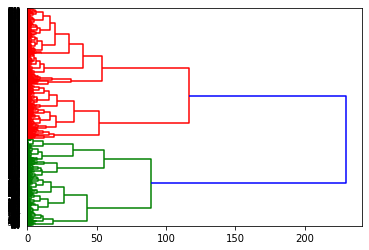

In [ ]:
dn = dendrogram(link, orientation = "right")

In [ ]:
# оставляем 4 кластера
df['cluster'] = fcluster(link, 4, criterion='maxclust')

Кластеры сбалансированы:

In [ ]:
df.groupby('cluster').size()

cluster
1    1474
2    1117
3    1583
4    2251
dtype: int64

In [ ]:
df.groupby('cluster').mean()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,1421,1422,1423,1424,1425,1426,1427,1428,1429,1430,1431,1432,1433,1434,1435,1436,1437,1438,1439,1440,1441,1442,1443,1444,1445,1446,1447,1448,1449,1450,1451,1452,1453,1454,1455,1456,1457,1458,1459,1460
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.073203,0.072705,0.072738,0.072389,0.071848,0.071424,0.070896,0.070533,0.070106,0.069836,0.069571,0.069315,0.069035,0.068746,0.068510,0.068242,0.068005,0.067776,0.067580,0.067409,0.067236,0.067119,0.066997,0.066907,0.066806,0.066727,0.066618,0.066510,0.066376,0.066206,0.065782,0.065395,0.065038,0.064801,0.064653,0.064606,0.064613,0.064687,0.064810,0.064990,...,0.106933,0.106847,0.106598,0.106341,0.105957,0.105658,0.105270,0.104906,0.104488,0.104061,0.103619,0.103479,0.103362,0.103273,0.103247,0.103198,0.103199,0.103161,0.103097,0.102998,0.102850,0.102721,0.102472,0.102263,0.101978,0.101814,0.101548,0.101256,0.100882,0.100400,0.100007,0.099548,0.099359,0.099008,0.098879,0.098476,0.098163,0.097967,0.097609,0.098036
2,0.000214,0.000218,0.000216,0.000219,0.000219,0.000220,0.000221,0.000221,0.000219,0.000217,0.000217,0.000218,0.000219,0.000219,0.000220,0.000220,0.000220,0.000220,0.000220,0.000220,0.000221,0.000221,0.000222,0.000222,0.000223,0.000224,0.000226,0.000227,0.000228,0.000228,0.000229,0.000230,0.000230,0.000230,0.000230,0.000231,0.000231,0.000231,0.000232,0.000232,...,0.001769,0.001643,0.001521,0.001405,0.001296,0.001191,0.001095,0.001006,0.000924,0.000849,0.000780,0.000735,0.000691,0.000651,0.000614,0.000580,0.000552,0.000523,0.000496,0.000469,0.000442,0.000416,0.000393,0.000370,0.000350,0.000331,0.000317,0.000305,0.000293,0.000285,0.000283,0.000279,0.000278,0.000275,0.000274,0.000278,0.000279,0.000275,0.000275,0.000285
3,0.161399,0.162587,0.162914,0.162875,0.162787,0.162261,0.161885,0.161502,0.161357,0.161221,0.161044,0.160890,0.160596,0.160342,0.160086,0.159929,0.159765,0.159531,0.159282,0.158958,0.158596,0.158254,0.157956,0.157657,0.157322,0.156971,0.156608,0.156243,0.155946,0.155670,0.155110,0.154459,0.153788,0.153170,0.152563,0.152130,0.151712,0.151312,0.150864,0.150366,...,0.282327,0.281746,0.281054,0.280355,0.279745,0.279145,0.278711,0.278215,0.277648,0.276979,0.276272,0.276039,0.275792,0.275624,0.275419,0.275217,0.274978,0.274762,0.274689,0.274648,0.274683,0.274732,0.274687,0.274558,0.274419,0.274365,0.274357,0.274296,0.274200,0.273935,0.273626,0.273434,0.273323,0.273295,0.273078,0.272828,0.272124,0.271117,0.270369,0.269460
4,0.107639,0.107118,0.107190,0.106916,0.106717,0.106427,0.106078,0.105840,0.105514,0.105298,0.105032,0.104796,0.104605,0.104360,0.104164,0.103938,0.103741,0.103548,0.103332,0.103133,0.102860,0.102635,0.102416,0.102183,0.101973,0.101727,0.101502,0.101264,0.101034,0.100840,0.100325,0.099864,0.099350,0.098881,0.098427,0.098008,0.097670,0.097307,0.097015,0.096697,...,0.192728,0.192761,0.192848,0.192884,0.192944,0.193045,0.193070,0.193159,0.193153,0.193155,0.193128,0.193195,0.193287,0.193362,0.193482,0.193594,0.193730,0.193913,0.194086,0.194337,0.194584,0.194866,0.195091,0.195191,0.195327,0.195385,0.195486,0.195582,0.195597,0.195607,0.195451,0.195399,0.195296,0.195228,0.195139,0.194740,0.194529,0.193966,0.193766,0.193640


# K-means

Из графика коменистой осыпи также можем выделить 4 кластера:

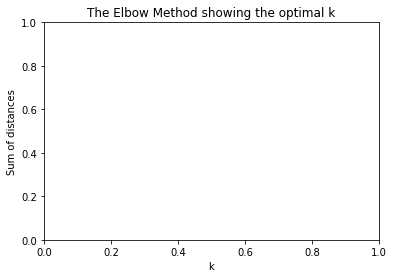

In [ ]:
from sklearn.cluster import KMeans

K = range(1, 11)
models = [KMeans(n_clusters=k, random_state=42).fit(df) for k in K]
dist = [model.inertia_ for model in models]

# Plot the elbow
plt.xlabel('k')
plt.ylabel('Sum of distances')
plt.title('The Elbow Method showing the optimal k')
plt.show()

Исходя из последней колонки видим, что результаты обеих кластеризаций практически совпали.

In [ ]:
model = KMeans(n_clusters=4, random_state=42)
model.fit(df.drop(['cluster'], axis=1))

df['cluster_2'] = model.labels_
df.groupby('cluster_2').mean()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,1422,1423,1424,1425,1426,1427,1428,1429,1430,1431,1432,1433,1434,1435,1436,1437,1438,1439,1440,1441,1442,1443,1444,1445,1446,1447,1448,1449,1450,1451,1452,1453,1454,1455,1456,1457,1458,1459,1460,cluster
cluster_2,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.000377,0.000388,0.000389,0.000391,0.000391,0.000389,0.000388,0.000386,0.000381,0.000376,0.000374,0.000374,0.000374,0.000374,0.000374,0.000374,0.000374,0.000373,0.000372,0.000373,0.000374,0.000374,0.000374,0.000375,0.000375,0.000376,0.000377,0.000378,0.000380,0.000381,0.000381,0.000381,0.000380,0.000381,0.000383,0.000386,0.000389,0.000393,0.000399,0.000404,...,0.002306,0.002118,0.001933,0.001754,0.001593,0.001448,0.001331,0.001222,0.001130,0.001044,0.000985,0.000929,0.000884,0.000849,0.000820,0.000794,0.000768,0.000743,0.000716,0.000688,0.000661,0.000638,0.000615,0.000592,0.000570,0.000552,0.000531,0.000506,0.000481,0.000471,0.000466,0.000463,0.000460,0.000460,0.000463,0.000463,0.000460,0.000459,0.000466,1.897457
1,0.170425,0.171640,0.171959,0.171946,0.171860,0.171314,0.170923,0.170509,0.170339,0.170182,0.169988,0.169820,0.169510,0.169247,0.168966,0.168791,0.168610,0.168357,0.168092,0.167745,0.167369,0.167018,0.166713,0.166413,0.166073,0.165719,0.165354,0.164989,0.164692,0.164416,0.163843,0.163178,0.162498,0.161869,0.161254,0.160820,0.160402,0.160013,0.159577,0.159094,...,0.286386,0.285698,0.285006,0.284394,0.283794,0.283372,0.282880,0.282320,0.281651,0.280936,0.280703,0.280451,0.280283,0.280069,0.279859,0.279621,0.279405,0.279337,0.279299,0.279334,0.279386,0.279339,0.279217,0.279080,0.279032,0.279028,0.278973,0.278891,0.278636,0.278336,0.278140,0.278029,0.278001,0.277796,0.277567,0.276849,0.275846,0.275070,0.274076,3.078094
2,0.077637,0.077019,0.077121,0.076767,0.076200,0.075755,0.075180,0.074798,0.074338,0.074058,0.073781,0.073514,0.073234,0.072934,0.072698,0.072423,0.072187,0.071968,0.071786,0.071632,0.071465,0.071357,0.071243,0.071156,0.071064,0.070995,0.070898,0.070800,0.070671,0.070511,0.070087,0.069716,0.069364,0.069140,0.069018,0.068997,0.069040,0.069146,0.069310,0.069529,...,0.116262,0.116033,0.115781,0.115383,0.115070,0.114645,0.114242,0.113776,0.113293,0.112795,0.112643,0.112518,0.112408,0.112361,0.112285,0.112260,0.112200,0.112104,0.111974,0.111787,0.111610,0.111317,0.111056,0.110739,0.110532,0.110213,0.109871,0.109432,0.108905,0.108433,0.107906,0.107648,0.107222,0.107074,0.106599,0.106267,0.106006,0.105589,0.106005,1.352941
3,0.104787,0.104353,0.104396,0.104102,0.103908,0.103625,0.103298,0.103077,0.102781,0.102579,0.102324,0.102096,0.101903,0.101660,0.101469,0.101251,0.101058,0.100860,0.100637,0.100427,0.100147,0.099910,0.099680,0.099435,0.099210,0.098947,0.098703,0.098445,0.098201,0.097988,0.097459,0.096972,0.096434,0.095941,0.095453,0.095002,0.094625,0.094220,0.093878,0.093509,...,0.193644,0.193731,0.193775,0.193865,0.193986,0.194040,0.194150,0.194165,0.194188,0.194187,0.194262,0.194361,0.194448,0.194581,0.194708,0.194853,0.195042,0.195229,0.195496,0.195770,0.196082,0.196333,0.196456,0.196606,0.196686,0.196819,0.196941,0.196988,0.197017,0.196893,0.196877,0.196812,0.196788,0.196694,0.196314,0.196098,0.195540,0.195368,0.195284,3.796444


In [ ]:
coo_index = pd.read_csv('/content/drive/MyDrive/skoltech/global_soil_moisture-main/index.csv')
coo_index['cluster_hier'] = df['cluster']
coo_index['cluster_kmeans'] = df['cluster_2']
coo_index.columns = ['coord', 'cluster_hier', 'cluster_kmeans']

In [ ]:
coo_index

,coord,cluster_hier,cluster_kmeans
0,"(63.125, 25.375)",1,2
1,"(63.125, 25.625)",1,2
2,"(63.125, 25.875)",1,2
3,"(63.125, 26.125)",1,2
4,"(63.125, 26.375)",1,2
...,...,...,...
6420,"(85.875, 34.875)",2,0
6421,"(85.875, 35.125)",2,0
6422,"(85.875, 35.375)",2,0
6423,"(85.875, 35.625)",2,0


In [ ]:
coo_index['x'] = coo_index.coord.apply(lambda x: x.replace(')', '').replace('(', '').split(',')[0])
coo_index['y'] = coo_index.coord.apply(lambda x: x.replace(')', '').replace('(', '').split(',')[1])

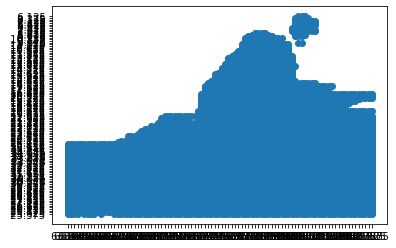

In [ ]:
plt.scatter(coo_index.x, coo_index.y)

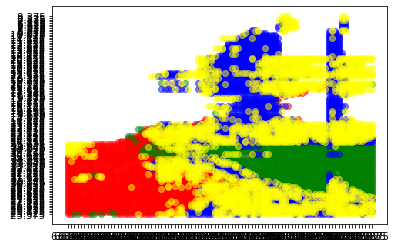

In [ ]:
colors = ("", "red", "green", "blue", "yellow")

for i in range(1, 5):
    plt.scatter(coo_index[coo_index.cluster_hier==i].x, coo_index[coo_index.cluster_hier==i].y, c=colors[i], alpha=.5)


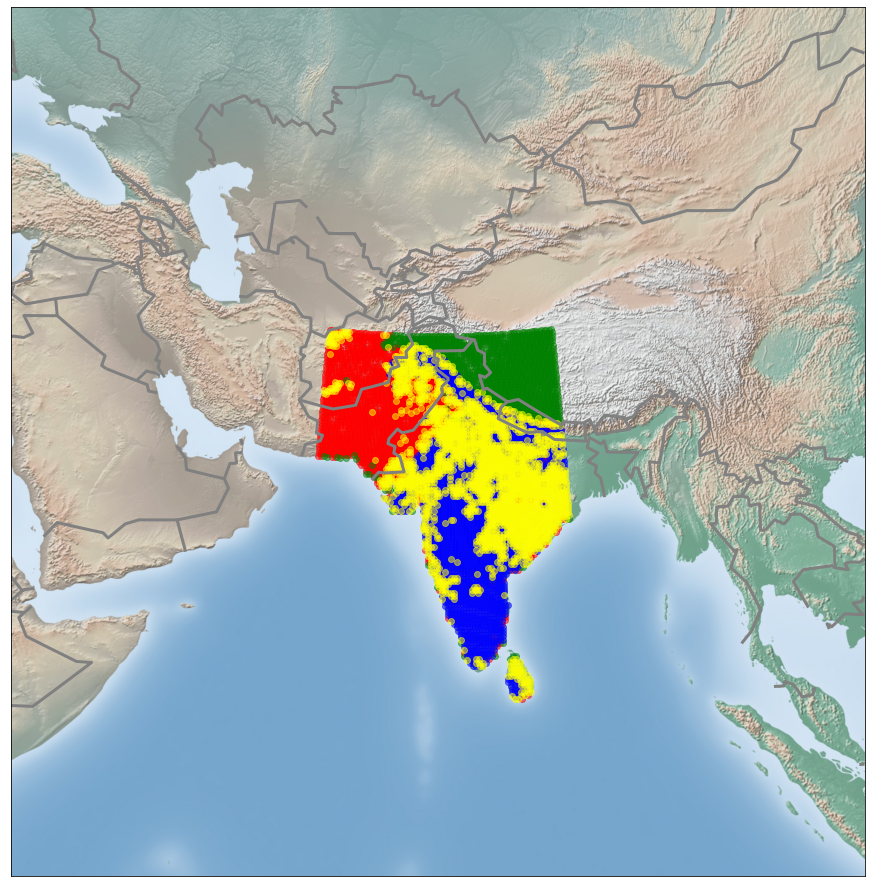

In [ ]:
colors = ("", "red", "green", "blue", "yellow")

fig = plt.figure(figsize=(16, 16))
m = Basemap(projection='gnom', lat_0=27.0238, lon_0=74.2179,
        width=8.05E6, height=8.2E6)
m.shadedrelief()
m.drawcountries(color='gray',linewidth=3)

for i in range(1, 5):
    x, y = m(coo_index[coo_index.cluster_hier==i].x, coo_index[coo_index.cluster_hier==i].y)
    plt.scatter(x, y, c=colors[i], alpha=.5)

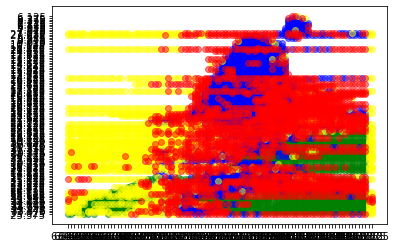

In [ ]:
colors = ("green", "blue", "yellow", "red")

for i in range(4):
    plt.scatter(coo_index[coo_index.cluster_kmeans==i].x, coo_index[coo_index.cluster_kmeans==i].y, c=colors[i], alpha=.5)


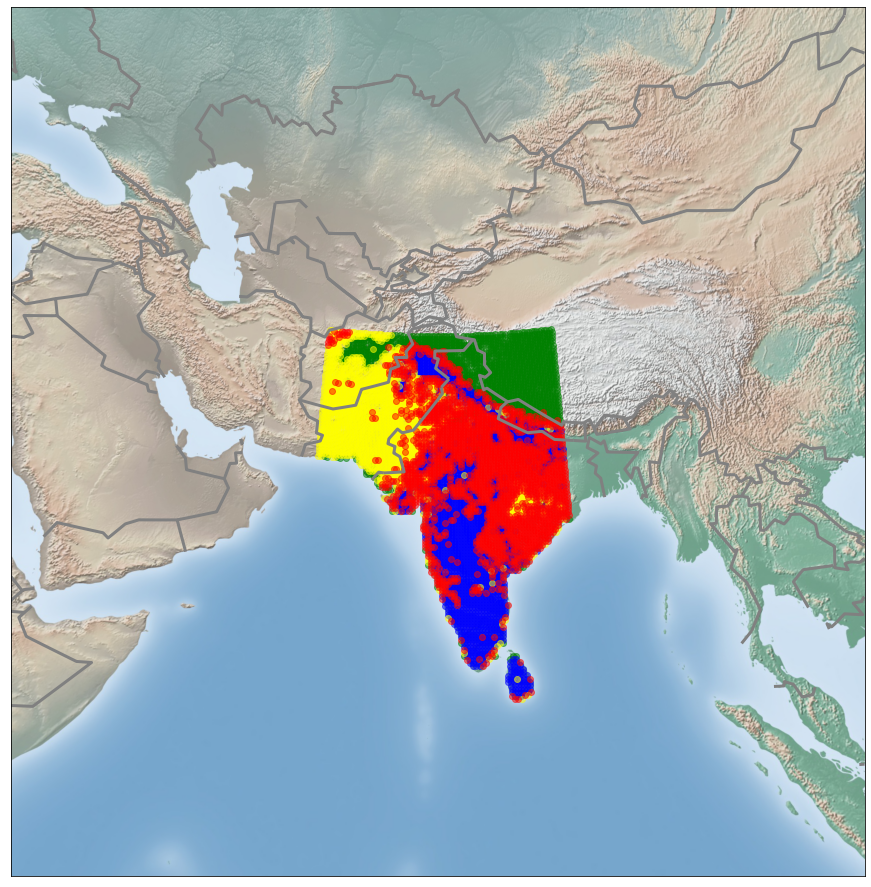

In [ ]:
fig = plt.figure(figsize=(16, 16))
m = Basemap(projection='gnom', lat_0=27.0238, lon_0=74.2179,
        width=8.05E6, height=8.2E6)
m.shadedrelief()
m.drawcountries(color='gray',linewidth=3)
colors = ("green", "blue", "yellow", "red")

for i in range(4):
    x, y = m(coo_index[coo_index.cluster_kmeans==i].x, coo_index[coo_index.cluster_kmeans==i].y)
    plt.scatter(x, y, c=colors[i], alpha=.5)

# EM

In [17]:
df = pd.read_csv('/content/drive/MyDrive/skoltech/global_soil_moisture-main/data.csv')
df.drop(['Unnamed: 0'], axis=1, inplace=True)

In [19]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph

import warnings

ac = AgglomerativeClustering(n_clusters=4,
                             affinity='euclidean', # “euclidean”, “l1”, “l2”, “manhattan”, 
                                                   # “cosine”, or “precomputed”
                             linkage='ward', # “ward”, “complete”, “average”, “single”
                            )

connectivity = kneighbors_graph(df, 
                                    n_neighbors=15, 
                                    include_self=False)
# делаем матрицу смежности симметричной
connectivity = 0.5 * (connectivity + connectivity.T)

ac = AgglomerativeClustering(n_clusters=6, 
                             linkage='average')

with warnings.catch_warnings():
    warnings.filterwarnings(
        "ignore",
        message="the number of connected components of the " +
        "connectivity matrix is [0-9]{1,2}" +
        " > 1. Completing it to avoid stopping the tree early.",
        category=UserWarning)
    ac.fit(df)
y_pred = ac.labels_.astype(np.int)
coo_index['cluster_aggl'] = y_pred

In [ ]:
colors = ("green", "blue", "yellow", "red")

for i in range(4):
    plt.scatter(coo_index[coo_index.cluster_aggl==i].x, coo_index[coo_index.cluster_aggl==i].y, c=colors[i], alpha=.5)

In [ ]:
from mpl_toolkits.basemap import Basemap

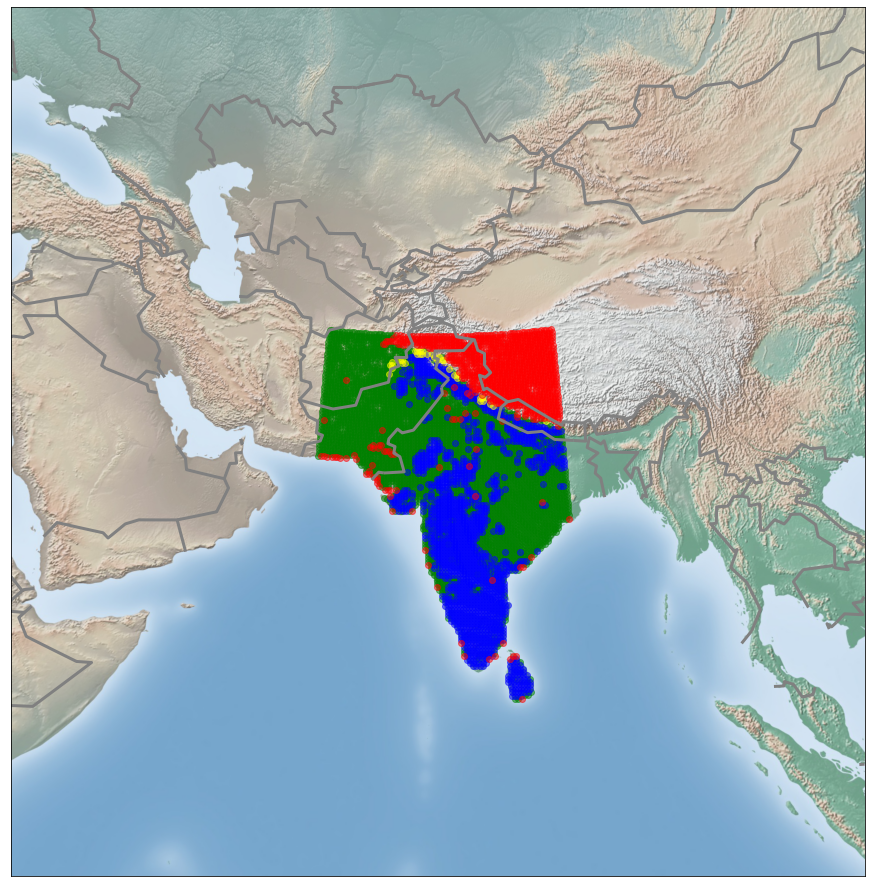

In [28]:
fig = plt.figure(figsize=(16, 16))
m = Basemap(projection='gnom', lat_0=27.0238, lon_0=74.2179,
        width=8.05E6, height=8.2E6)
m.shadedrelief()
m.drawcountries(color='gray',linewidth=3)
colors = ("green", "blue", "yellow", "red")

for i in range(4):
    xx = coo_index[coo_index.cluster_aggl==i].x.astype('float').to_list()
    yy = coo_index[coo_index.cluster_aggl==i].y.astype('float').to_list()
    x, y = m(xx, yy)
    plt.scatter(x, y, c=colors[i], alpha=.5)

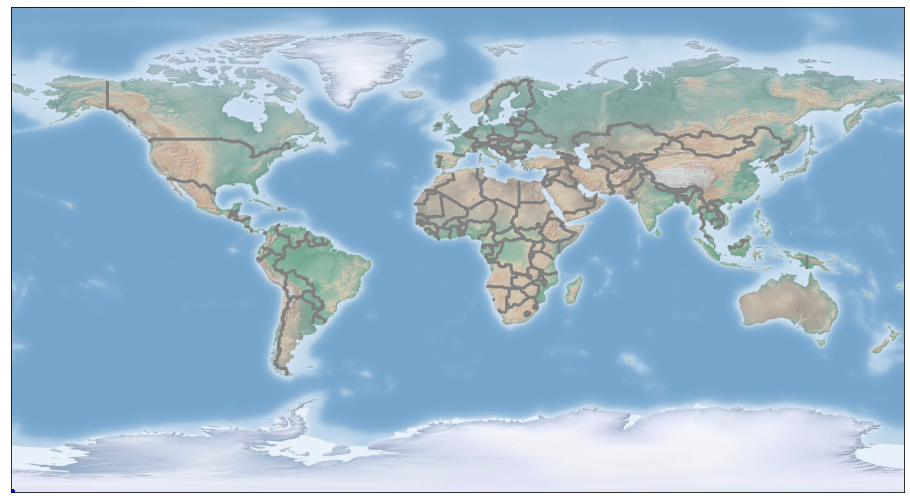

In [ ]:
fig = plt.figure(figsize=(16, 16))
m = Basemap(projection='gall')
m.shadedrelief()
m.drawcountries(color='gray',linewidth=3)

m.scatter(coo_index[coo_index.cluster_aggl==1].x, coo_index[coo_index.cluster_aggl==1].y, c=colors[1],
          cmap='YlGnBu_r', alpha=0.5)#create colorbar 
# Map (long, lat) to (x, y) for plotting

In [ ]:
colors = ("green", "blue", "yellow", "red")

#lon_0=20, lat_0=40, lat_1=58, lat_2=90,
fig = plt.figure(figsize=(8, 8))
m = Basemap(projection='gall')
"""m = Basemap(width=12000000,height=9000000,projection='lcc',
            resolution='c',lat_1=45.,lat_2=55,lat_0=50,lon_0=-107.)"""
"""m = Basemap(projection='lcc', resolution=None,
            lon_0=0, lat_0=140, lat_1=0, lat_2=180,
            width=1.6E7, height=1.2E7)"""
m.etopo(scale=0.5, alpha=0.5)

x, y = m(31.625, 69.875)
plt.plot(x, y, 'ok', markersize=5)
plt.text(x, y, ' India', fontsize=12);
# Map (long, lat) to (x, y) for plotting
for i in range(4):
    x = coo_index[coo_index.cluster_aggl==i].x
    y = coo_index[coo_index.cluster_aggl==i].y
    geometry = [shapely.geometry.Point(xy) for xy in zip(x, y)]

    print(x, y)
    m.scatter(x, y, c=colors[i], alpha=.5)
    

In [ ]:
!pip install geopandas

In [ ]:
!pip install osmnx==0.11

# Increase the number of clusters

In [44]:
# кластеризации по функциям за весь период
import warnings

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.neighbors import kneighbors_graph


def plot_map(num_of_clusters, coo_index, cluster_type):
  """
  строим карту, 
  lat_0, lon_0 - координаты центра (в данном случае - Индии)
  """
  colors = ("red", "green", "blue", "yellow", "purple", "olive", "lime", "aqua")

  fig = plt.figure(figsize=(15, 10))
  m = Basemap(projection='gnom', lat_0=27.0238, lon_0=74.2179,
          width=8.05E6, height=8.2E6)
  m.shadedrelief()
  m.drawcountries(color='gray',linewidth=3)

  # рисуем для каждого кластера
  for i in range(num_of_clusters):
      x, y = m(coo_index[coo_index.cluster==i].x.astype('float').to_list(), coo_index[coo_index.cluster==i].y.astype('float').to_list())
      plt.scatter(x, y, c=colors[i], alpha=.5)
  plt.title(f'Type={cluster_type}. Number of clusters={num_of_clusters}')
  plt.show()

def func_kmeans(num_of_clusters, path):
  """
  построение кластеризации методом k средних, 
  num_of_clusters - число кластеров
  path - путь до файла с данными
  """
  # read data
  df = pd.read_csv(f'{path}/data.csv')
  df.drop(['Unnamed: 0'], axis=1, inplace=True)


  model = KMeans(n_clusters=num_of_clusters, random_state=42)
  model.fit(df)

  df['cluster'] = model.labels_
  #print(df.groupby('cluster_kmeans').mean())

  coo_index = pd.read_csv(f'{path}/index.csv')
  #coo_index['cluster_hier'] = df['cluster']
  coo_index['cluster'] = df['cluster']
  coo_index.columns = ['coord', 'cluster']

  # преобразовываем индекс в коориднаты
  coo_index['x'] = coo_index.coord.apply(lambda x: x.replace(')', '').replace('(', '').split(',')[0])
  coo_index['y'] = coo_index.coord.apply(lambda x: x.replace(')', '').replace('(', '').split(',')[1])

  plot_map(num_of_clusters, coo_index, 'KMeans')


def func_hier(num_of_clusters, path):
  # read data
  df = pd.read_csv(f'{path}/data.csv')
  df.drop(['Unnamed: 0'], axis=1, inplace=True)

  # Объект, в котором будет хранится информация о последовательном слиянии кластеров
  link = linkage(df, 'ward', 'euclidean')
  # оставляем num_of_clusters кластера
  dn = dendrogram(link, orientation = "right")
  df['cluster'] = fcluster(link, num_of_clusters, criterion='maxclust')

  coo_index = pd.read_csv(f'{path}/index.csv')
  #coo_index['cluster_hier'] = df['cluster']
  coo_index['cluster'] = df['cluster']
  coo_index.columns = ['coord', 'cluster']

  # преобразовываем индекс в коориднаты
  coo_index['x'] = coo_index.coord.apply(lambda x: x.replace(')', '').replace('(', '').split(',')[0])
  coo_index['y'] = coo_index.coord.apply(lambda x: x.replace(')', '').replace('(', '').split(',')[1])

  plot_map(num_of_clusters, coo_index, 'Hier')
  

def func_em(num_of_clusters, path):
  # read data
  df = pd.read_csv(f'{path}/data.csv')
  df.drop(['Unnamed: 0'], axis=1, inplace=True)

  ac = AgglomerativeClustering(n_clusters=num_of_clusters,
                              affinity='euclidean', # “euclidean”, “l1”, “l2”, “manhattan”, 
                                                    # “cosine”, or “precomputed”
                              linkage='ward', # “ward”, “complete”, “average”, “single”
                              )

  ac = AgglomerativeClustering(n_clusters=6, 
                              linkage='average')

  with warnings.catch_warnings():
      warnings.filterwarnings(
          "ignore",
          message="the number of connected components of the " +
          "connectivity matrix is [0-9]{1,2}" +
          " > 1. Completing it to avoid stopping the tree early.",
          category=UserWarning)
      ac.fit(df)
  y_pred = ac.labels_.astype(np.int)
  coo_index = pd.read_csv(f'{path}/index.csv')
  #coo_index['cluster_hier'] = df['cluster']
  coo_index['cluster'] = y_pred
  coo_index.columns = ['coord', 'cluster']

  # преобразовываем индекс в коориднаты
  coo_index['x'] = coo_index.coord.apply(lambda x: x.replace(')', '').replace('(', '').split(',')[0])
  coo_index['y'] = coo_index.coord.apply(lambda x: x.replace(')', '').replace('(', '').split(',')[1])

  plot_map(num_of_clusters, coo_index, 'EM')
  

In [115]:
# смотрим в разрезе по годам

import warnings

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.neighbors import kneighbors_graph


def plot_map_per_year(num_of_clusters, coo_index, cluster_type, year, axes):
  """
  строится для 4х лет 4 оси 
  строим карту, 
  lat_0, lon_0 - координаты центра (в данном случае - Индии)
  """

  colors = ("red", "green", "blue", "yellow", "purple", "olive", "lime", "aqua")

  # рисуем для каждого кластера
  for i in range(num_of_clusters):
      axes[year].set_title(f'Type={cluster_type}. Number of clusters={num_of_clusters}. Year={2016 + year}')
      m = Basemap(projection='gnom', lat_0=27.0238, lon_0=74.2179,
          width=8.05E6, height=8.2E6, ax=axes[year])
      m.shadedrelief()
      m.drawcountries(color='gray',linewidth=3)
      x, y = m(coo_index[coo_index.cluster==i].x.astype('float').to_list(), coo_index[coo_index.cluster==i].y.astype('float').to_list())
      axes[year].scatter(x, y, c=colors[i], alpha=.5)
  #plt.show()


def func_kmeans_per_year(num_of_clusters, path, num_years=4):
  """
  построение кластеризации методом k средних, 
  num_of_clusters - число кластеров
  path - путь до файла с данными
  """

  fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(25, 15))

  # read data
  df = pd.read_csv(f'{path}/data.csv')
  df.drop(['Unnamed: 0'], axis=1, inplace=True)

  year = 365
    
  coo_index = pd.read_csv(f'/content/drive/MyDrive/skoltech/global_soil_moisture-main/index.csv')
  coo_index.columns = ['coord']
  # преобразовываем индекс в коориднаты
  coo_index['x'] = coo_index.coord.apply(lambda x: x.replace(')', '').replace('(', '').split(',')[0])
  coo_index['y'] = coo_index.coord.apply(lambda x: x.replace(')', '').replace('(', '').split(',')[1])

  for i in range(num_years):
    model = KMeans(n_clusters=num_of_clusters, random_state=42)
    data_tmp = df.iloc[:, year * i : year * (i + 1)]
    model.fit(data_tmp)
    #print(df.groupby('cluster_kmeans').mean())

    #coo_index['cluster_hier'] = df['cluster']
    coo_index['cluster'] = model.labels_
    plot_map_per_year(num_of_clusters, coo_index, 'KMeans', i, axes)


In [ ]:
func_kmeans_per_year(4, '/content/drive/MyDrive/skoltech/global_soil_moisture-main')

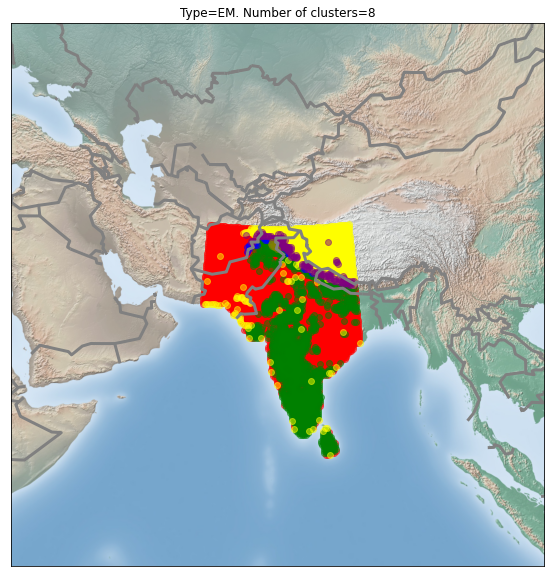

In [45]:
func_em(8, '/content/drive/MyDrive/skoltech/global_soil_moisture-main')

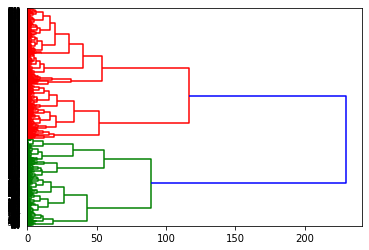

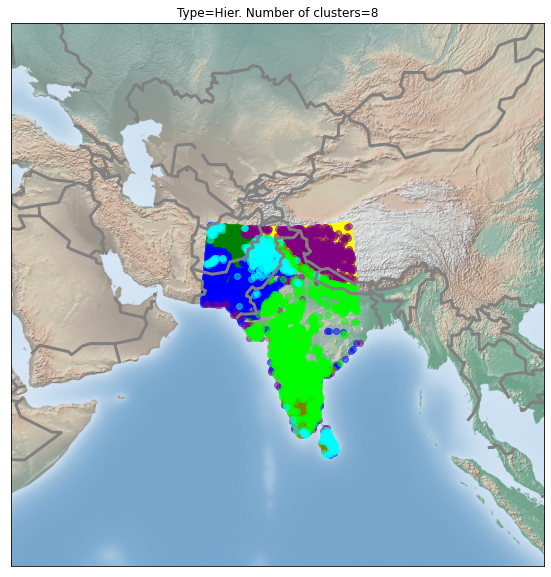

In [40]:
func_hier(8, '/content/drive/MyDrive/skoltech/global_soil_moisture-main')

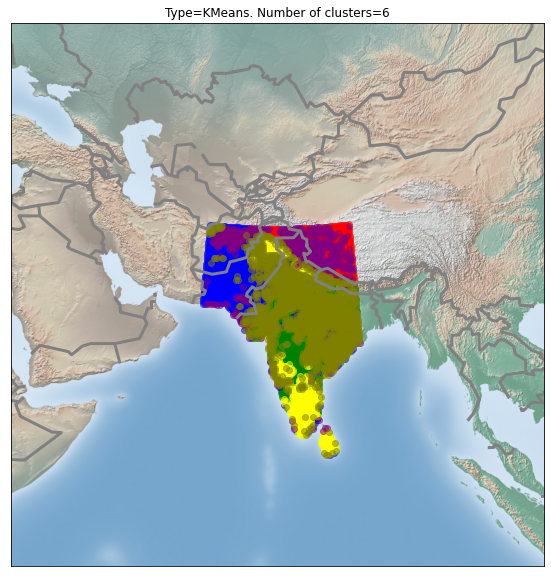

In [41]:
func_kmeans(6, '/content/drive/MyDrive/skoltech/global_soil_moisture-main')

                       0         1         2  ...      1458      1459      1460
cluster_kmeans                                ...                              
0               0.000123  0.000131  0.000134  ...  0.000396  0.000392  0.000386
1               0.139005  0.140586  0.141042  ...  0.261665  0.260739  0.259603
2               0.073698  0.073188  0.073247  ...  0.098525  0.098100  0.098545
3               0.093407  0.092523  0.092533  ...  0.167152  0.166821  0.167149
4               0.232298  0.233277  0.233436  ...  0.307325  0.306578  0.305500
5               0.123711  0.123531  0.123643  ...  0.224242  0.224192  0.223847
6               0.001058  0.001055  0.001057  ...  0.001508  0.001506  0.001517

[7 rows x 1461 columns]


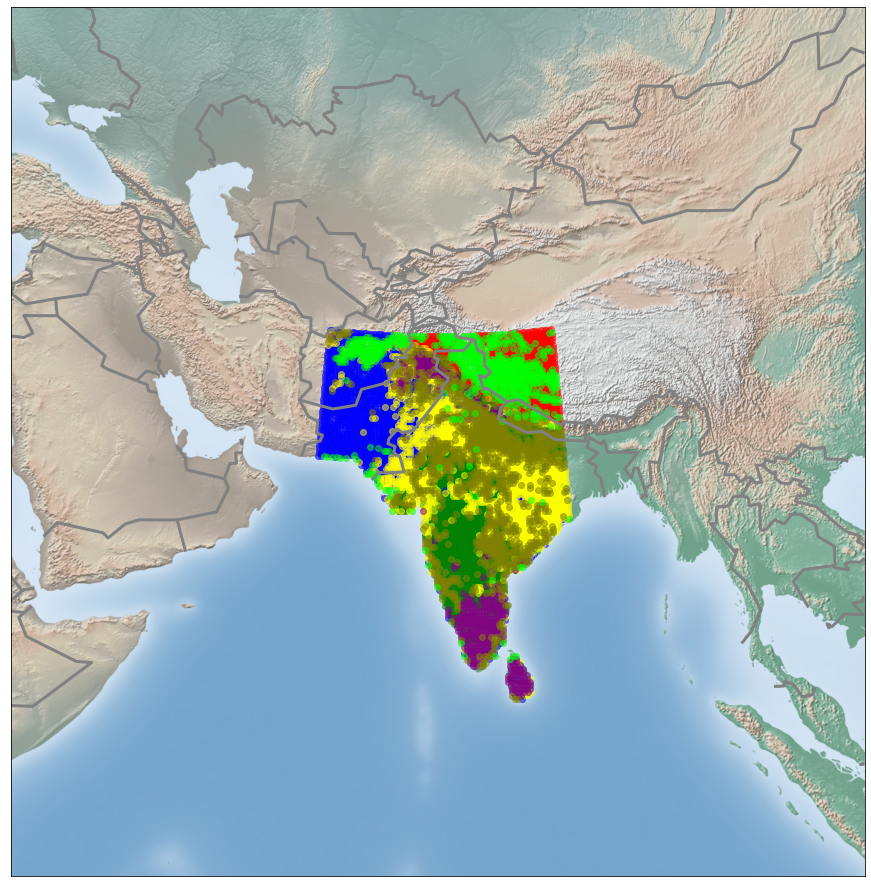

In [ ]:
func_kmeans(7, '/content/drive/MyDrive/skoltech/global_soil_moisture-main')

                       0         1         2  ...      1458      1459      1460
cluster_kmeans                                ...                              
0               0.000123  0.000131  0.000134  ...  0.000296  0.000292  0.000286
1               0.178355  0.178250  0.178498  ...  0.233945  0.233567  0.233516
2               0.074077  0.073571  0.073643  ...  0.098790  0.098355  0.098800
3               0.113076  0.112934  0.113064  ...  0.218696  0.218683  0.218222
4               0.229618  0.230872  0.231072  ...  0.315323  0.314472  0.313258
5               0.001058  0.001055  0.001057  ...  0.001508  0.001506  0.001517
6               0.141895  0.143393  0.143808  ...  0.263461  0.262585  0.261511
7               0.091759  0.090781  0.090726  ...  0.166687  0.166362  0.166735

[8 rows x 1461 columns]


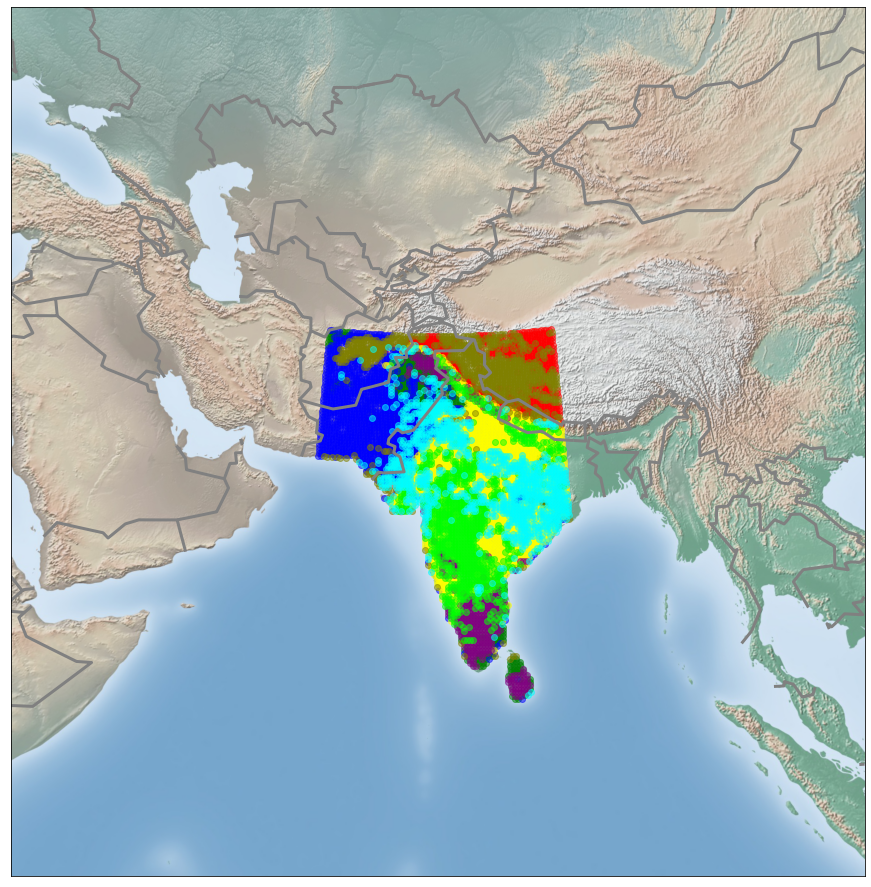

In [ ]:
func_kmeans(8, '/content/drive/MyDrive/skoltech/global_soil_moisture-main')